In [1]:
import argparse
import os, time, datetime
import PIL.Image as Image
import numpy as np
import torch.nn as nn
import torch.nn.init as init
import torch
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim
from skimage.io import imread, imsave
import sys
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
def parse_args():
    parser = argparse.ArgumentParser()
    parser.add_argument('--set_dir', default='data/Test', type=str, help='directory of test dataset')
    parser.add_argument('--set_names', default=['Set68', 'Set12'], help='directory of test dataset')
    parser.add_argument('--sigma', default=4, type=int, help='noise level')
    parser.add_argument('--model_dir', default=os.path.join('models', 'DnCNN_sigma4'), help='directory of the model')
    parser.add_argument('--model_name', default='model_003.pth', type=str, help='the model name')
    parser.add_argument('--result_dir', default='results', type=str, help='directory of test dataset')
    parser.add_argument('--save_result', default=0, type=int, help='save the denoised image, 1 or 0')
    return parser.parse_args()


def log(*args, **kwargs):
     print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S:"), *args, **kwargs)


def save_result(result, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt', '.dlm'):
        np.savetxt(path, result, fmt='%2.4f')
    else:
        imsave(path, np.clip(result, 0, 1))


def show(x, title=None, cbar=False, figsize=None):
    import matplotlib.pyplot as plt
    plt.figure(figsize=figsize)
    plt.imshow(x, interpolation='nearest', cmap='gray')
    if title:
        plt.title(title)
    if cbar:
        plt.colorbar()
    plt.show()

In [4]:
class DnCNN(nn.Module):
    def __init__(self, out_channels=64, in_channels=1, kernel_size=3):
        super(DnCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, padding=1, stride=1)
        self.BN = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        output_layers = []
        for _ in range(10):
            for sub in self.make_Residual():
                output_layers.append(sub)
        self.out = nn.Sequential(*output_layers)
        self.res = nn.Conv2d(64, 1, kernel_size=3, padding=1, stride=1)
        
    def make_Residual(self, in_channels=64, out_channels=64, kernel_size=3):
        i = 0
        layers = []
        for i in range(2):
            layers.append(nn.Conv2d(64, 64, kernel_size=3, padding=1, stride=1, bias=True))
            layers.append(nn.BatchNorm2d(64, eps=0.0001, momentum=0.95))
            layers.append(nn.ReLU(inplace=True))
        return layers

    
    def forward(self, x):
        y = x
        out = self.out(self.relu(self.BN(self.conv1(x))))
        dn = y - self.res(out)
        return dn
        

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.orthogonal_(m.weight)
                print('init weight')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

2024-12-13 03:26:13: load trained model
     Set68 : test062.png : 0.1439 second


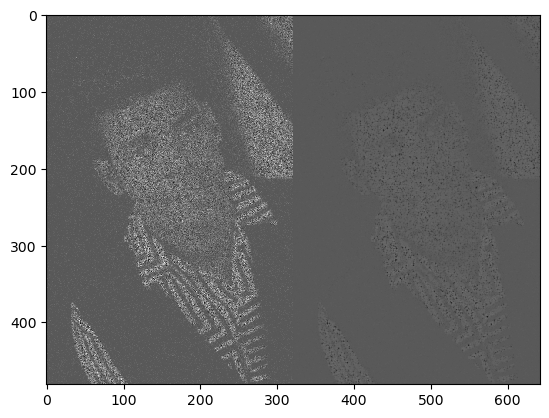

     Set68 : test065.png : 0.0405 second


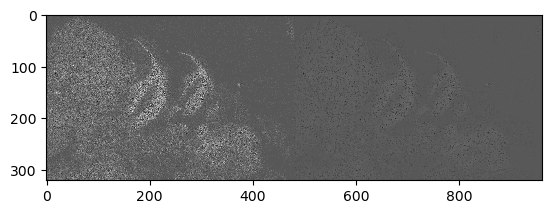

     Set68 : test019.png : 0.0389 second


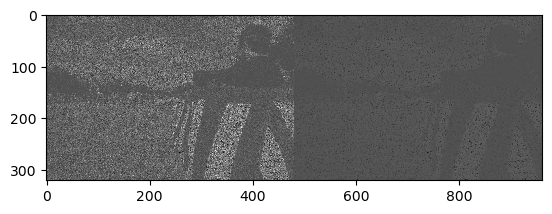

     Set68 : test017.png : 0.0389 second


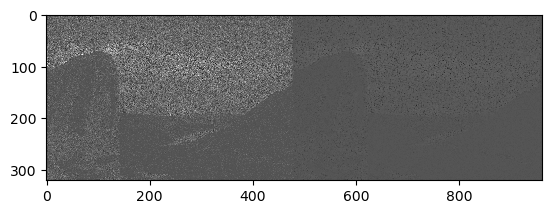

     Set68 : test010.png : 0.0389 second


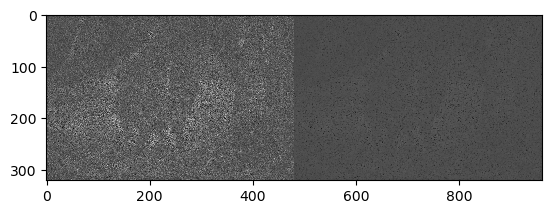

     Set68 : test025.png : 0.0389 second


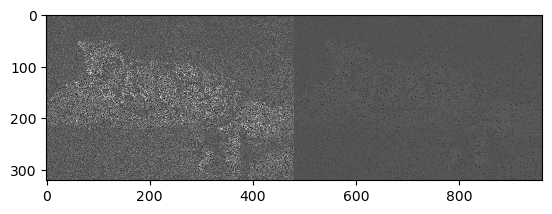

     Set68 : test059.png : 0.0389 second


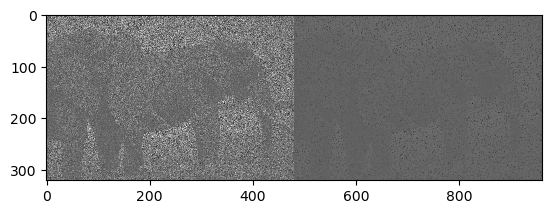

     Set68 : test022.png : 0.0389 second


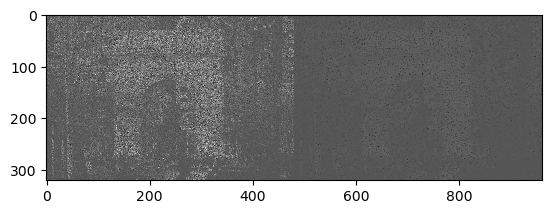

     Set68 : test050.png : 0.0389 second


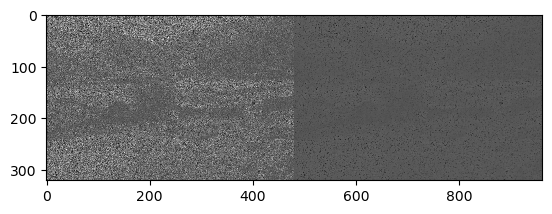

     Set68 : test057.png : 0.0389 second


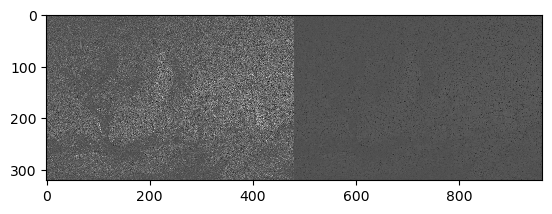

     Set68 : test046.png : 0.0390 second


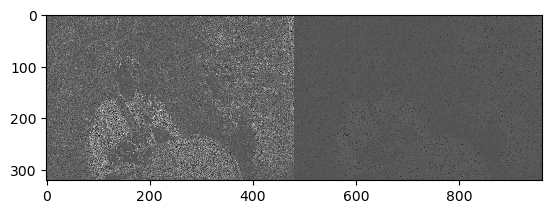

     Set68 : test041.png : 0.0389 second


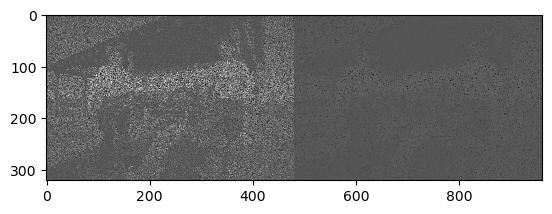

     Set68 : test033.png : 0.0389 second


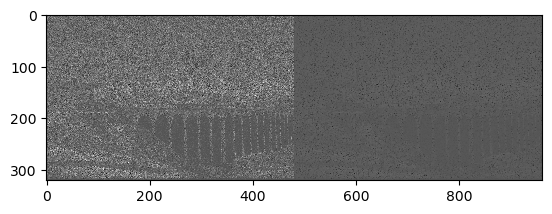

     Set68 : test034.png : 0.0387 second


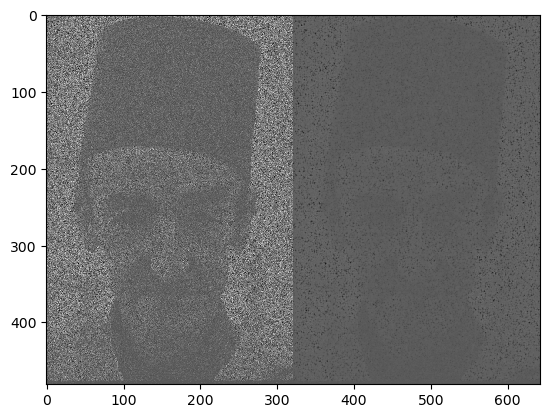

     Set68 : test048.png : 0.0390 second


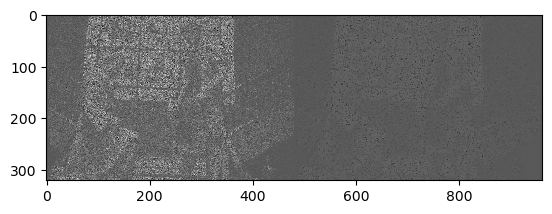

     Set68 : test001.png : 0.0386 second


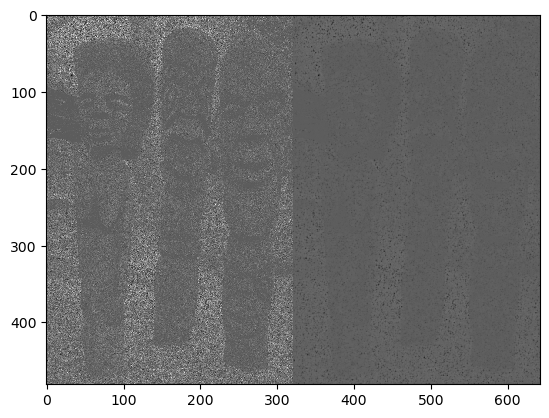

     Set68 : test006.png : 0.0389 second


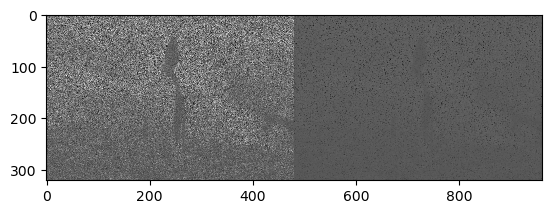

     Set68 : test008.png : 0.0389 second


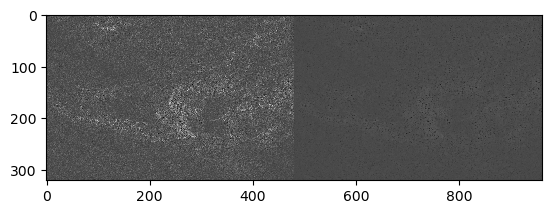

     Set68 : test056.png : 0.0388 second


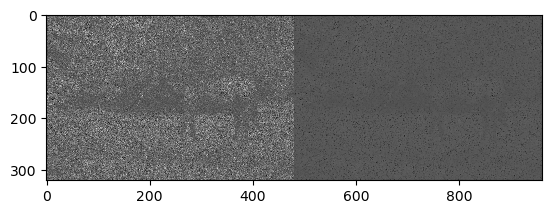

     Set68 : test051.png : 0.0389 second


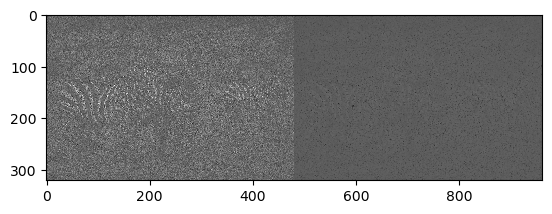

     Set68 : test023.png : 0.0388 second


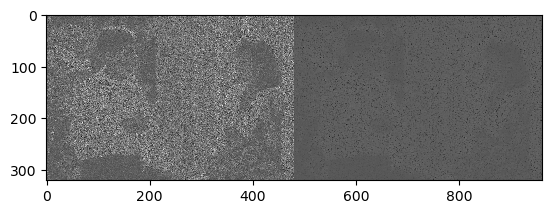

     Set68 : test024.png : 0.0388 second


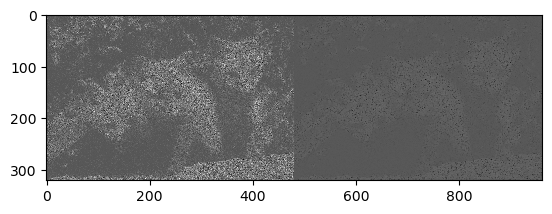

     Set68 : test058.png : 0.0388 second


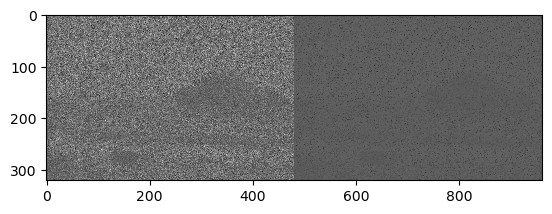

     Set68 : test011.png : 0.0388 second


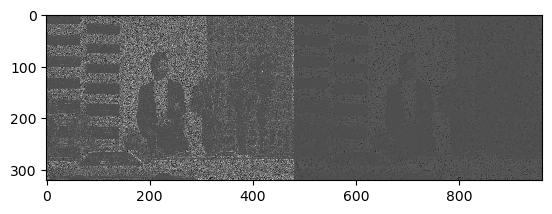

     Set68 : test016.png : 0.0389 second


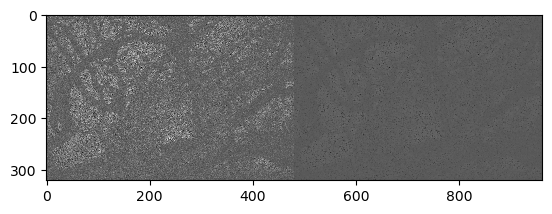

     Set68 : test064.png : 0.0386 second


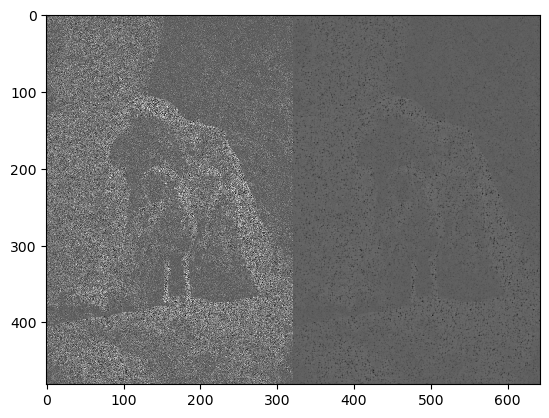

     Set68 : test018.png : 0.0389 second


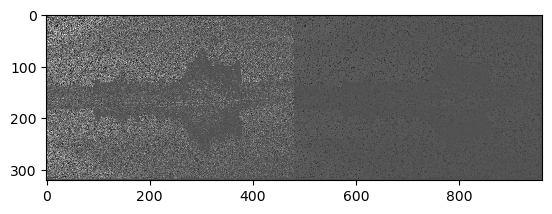

     Set68 : test063.png : 0.0389 second


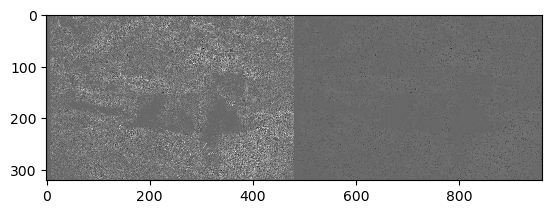

     Set68 : test009.png : 0.0388 second


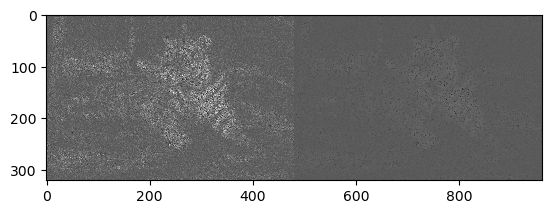

     Set68 : test007.png : 0.0389 second


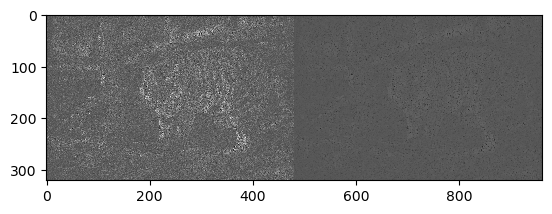

     Set68 : test035.png : 0.0389 second


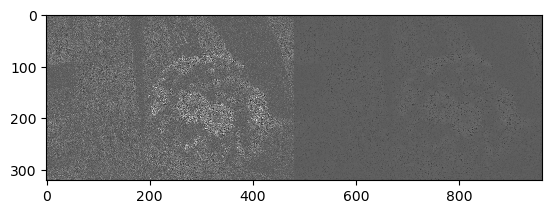

     Set68 : test049.png : 0.0390 second


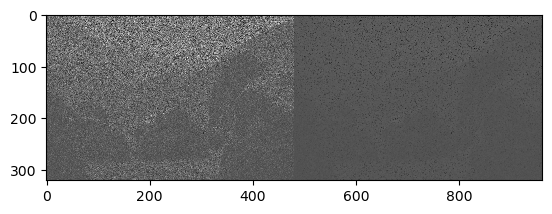

     Set68 : test032.png : 0.0389 second


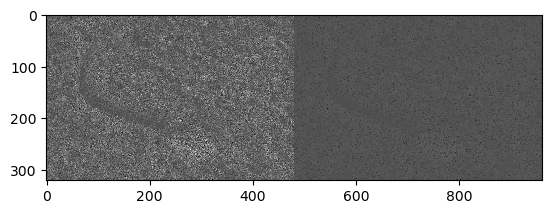

     Set68 : test040.png : 0.0389 second


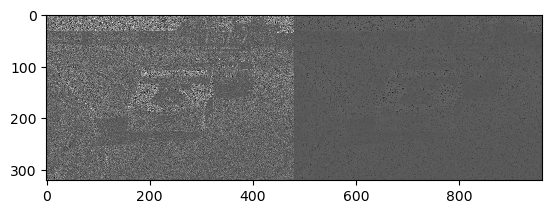

     Set68 : test047.png : 0.0389 second


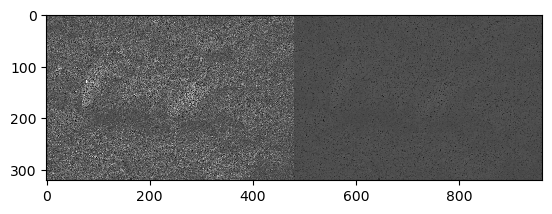

     Set68 : test003.png : 0.0386 second


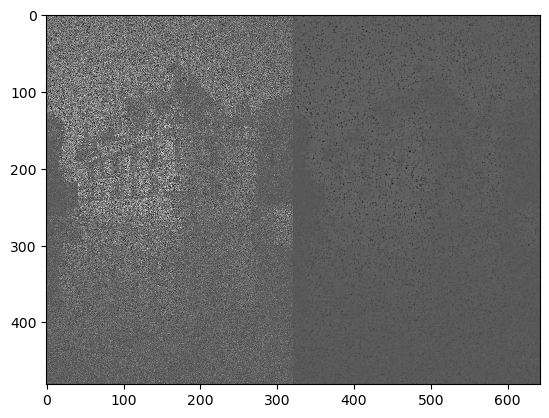

     Set68 : test004.png : 0.0389 second


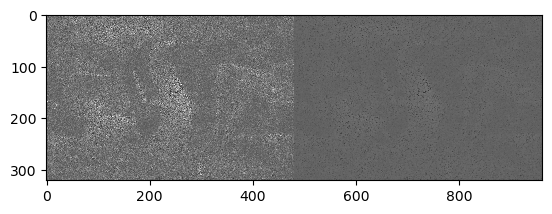

     Set68 : test031.png : 0.0388 second


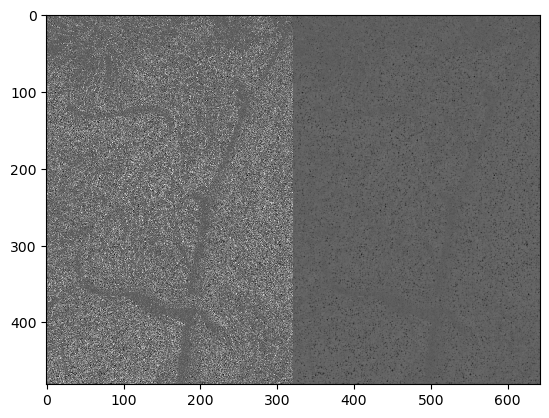

     Set68 : test036.png : 0.0391 second


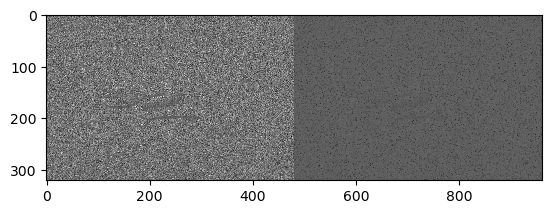

     Set68 : test038.png : 0.0386 second


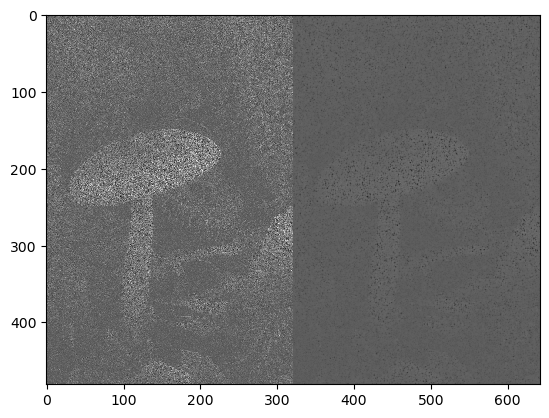

     Set68 : test044.png : 0.0389 second


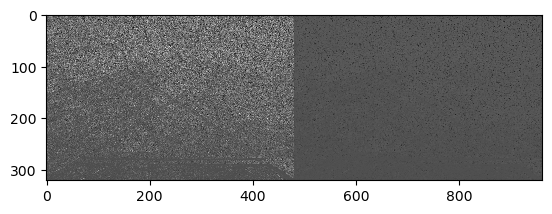

     Set68 : test043.png : 0.0389 second


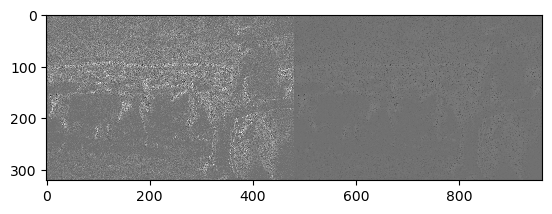

     Set68 : test052.png : 0.0389 second


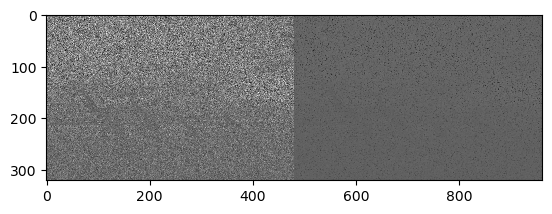

     Set68 : test029.png : 0.0388 second


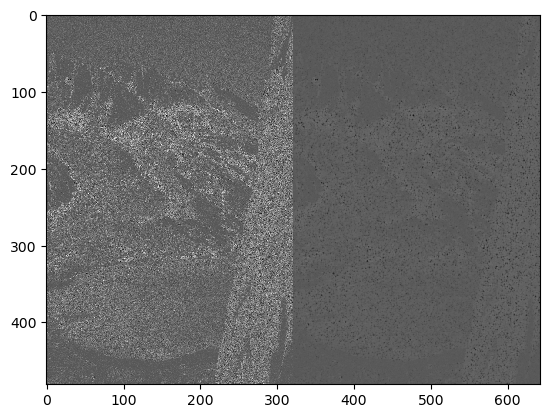

     Set68 : test055.png : 0.0387 second


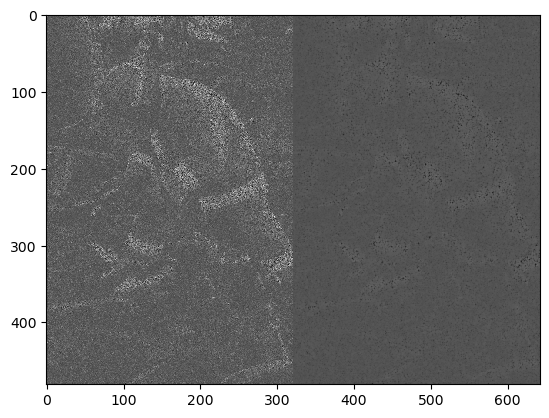

     Set68 : test027.png : 0.0390 second


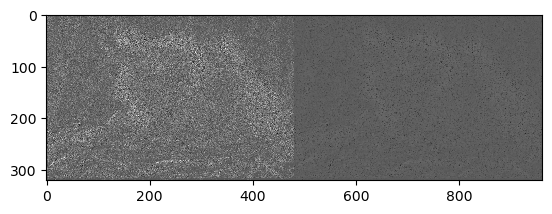

     Set68 : test020.png : 0.0389 second


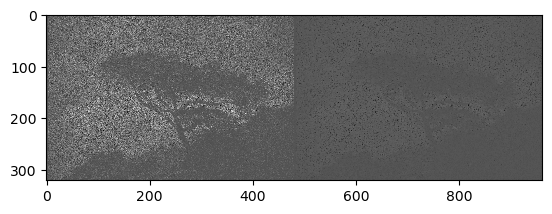

     Set68 : test015.png : 0.0390 second


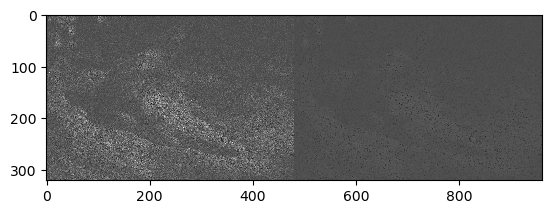

     Set68 : test012.png : 0.0389 second


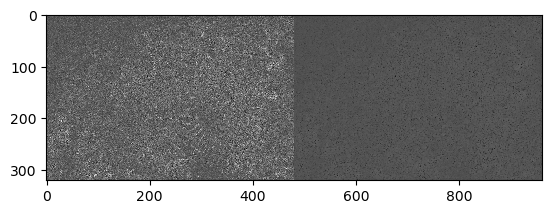

     Set68 : test060.png : 0.0391 second


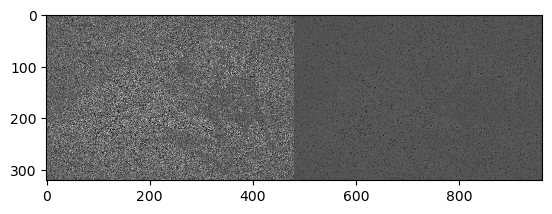

     Set68 : test067.png : 0.0388 second


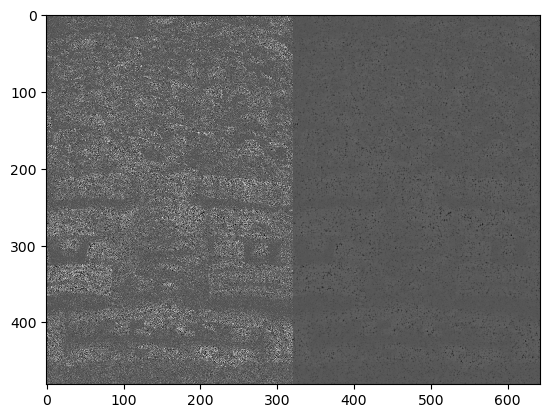

     Set68 : test042.png : 0.0389 second


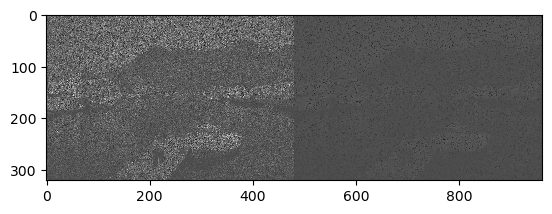

     Set68 : test039.png : 0.0387 second


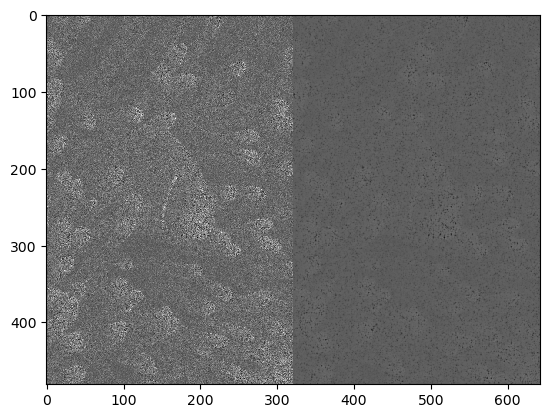

     Set68 : test045.png : 0.0387 second


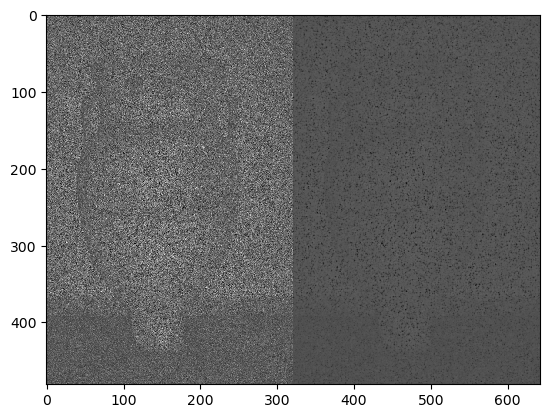

     Set68 : test037.png : 0.0390 second


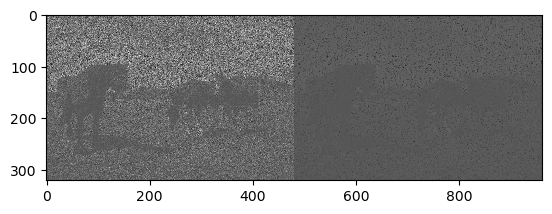

     Set68 : test030.png : 0.0389 second


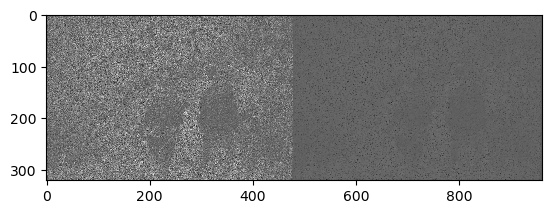

     Set68 : test005.png : 0.0390 second


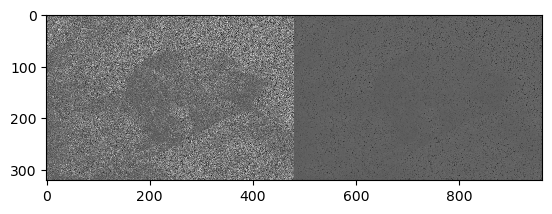

     Set68 : test002.png : 0.0386 second


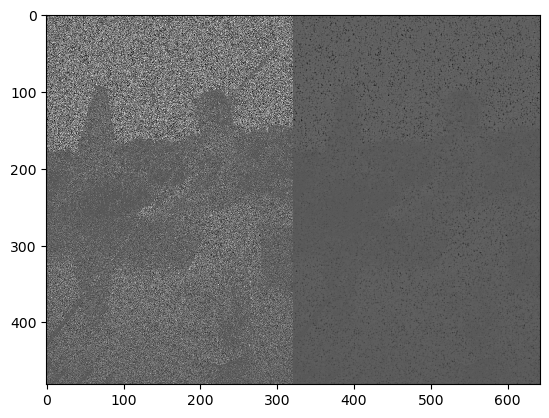

     Set68 : test066.png : 0.0389 second


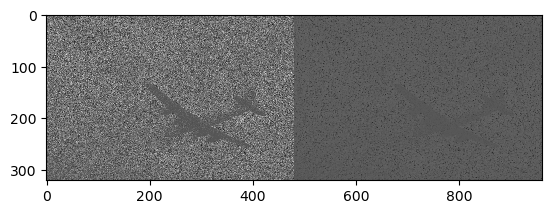

     Set68 : test061.png : 0.0390 second


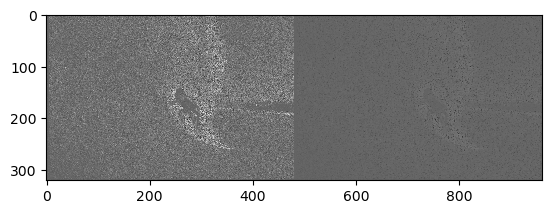

     Set68 : test013.png : 0.0389 second


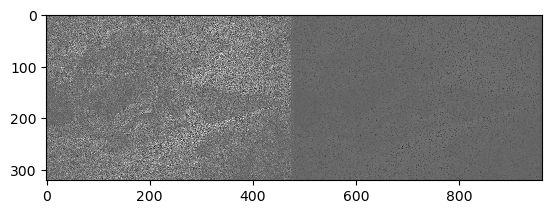

     Set68 : test068.png : 0.0389 second


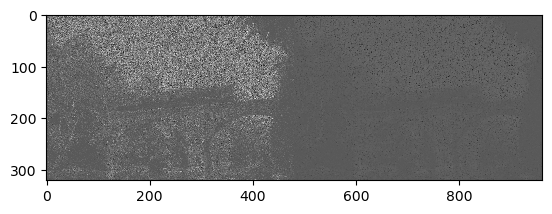

     Set68 : test014.png : 0.0389 second


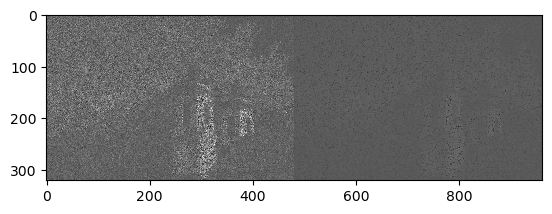

     Set68 : test021.png : 0.0386 second


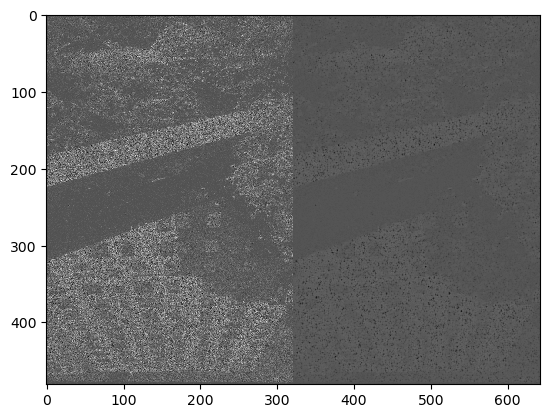

     Set68 : test026.png : 0.0390 second


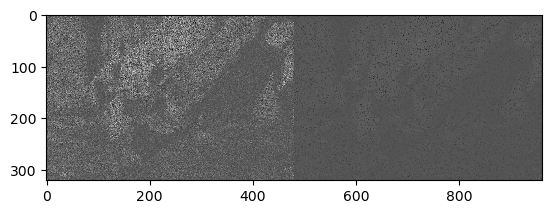

     Set68 : test028.png : 0.0388 second


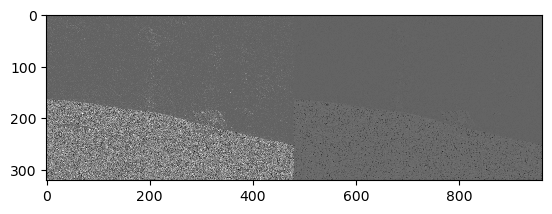

     Set68 : test054.png : 0.0387 second


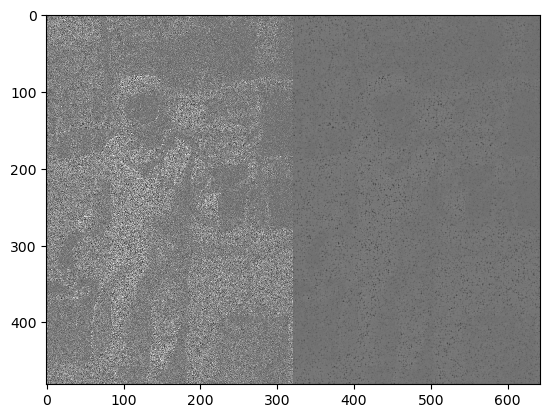

     Set68 : test053.png : 0.0389 second


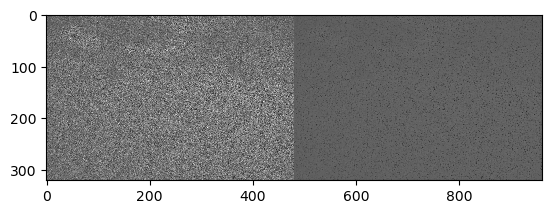

2024-12-13 03:26:25: Dataset: Set68      
  PSNR = 3.16dB, SSIM = 0.0268
     Set12 :     09.png : 0.0606 second


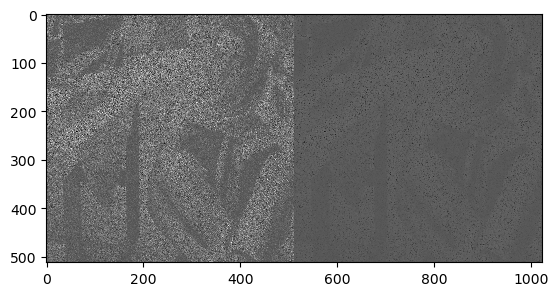

     Set12 :     07.png : 0.0171 second


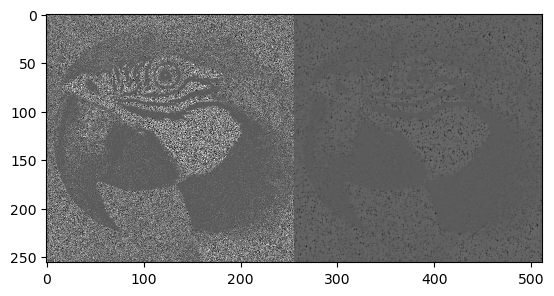

     Set12 :     11.png : 0.0576 second


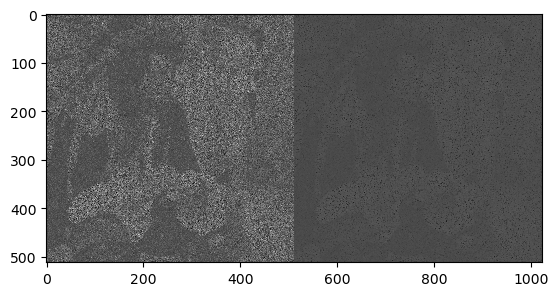

     Set12 :     01.png : 0.0150 second


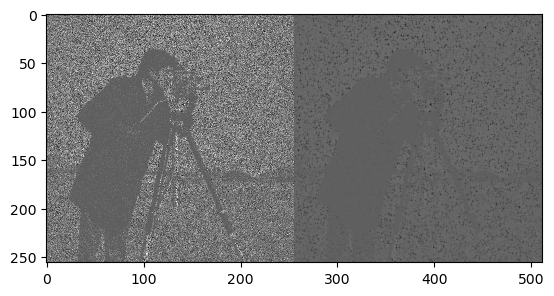

     Set12 :     06.png : 0.0149 second


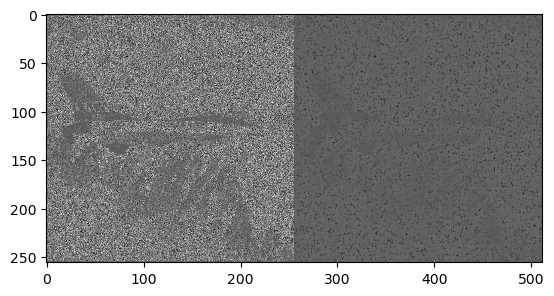

     Set12 :     08.png : 0.0578 second


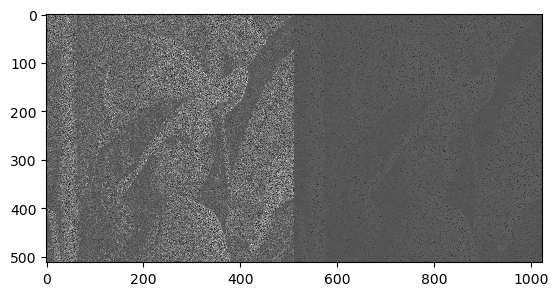

     Set12 :     10.png : 0.0577 second


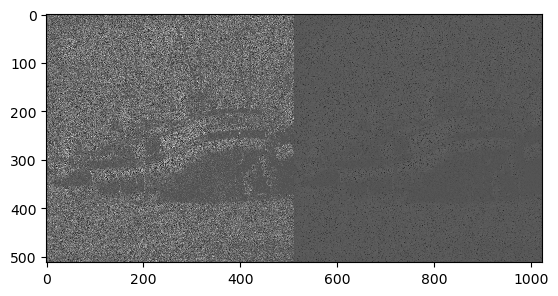

     Set12 :     05.png : 0.0150 second


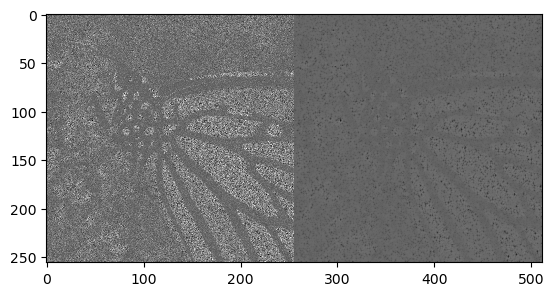

     Set12 :     02.png : 0.0149 second


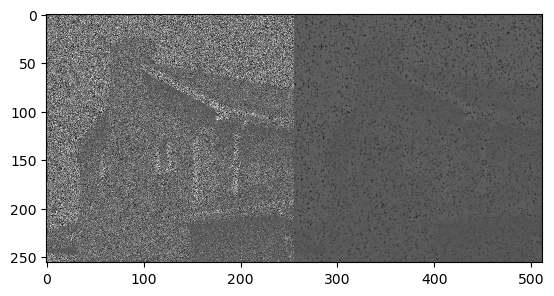

     Set12 :     12.png : 0.0576 second


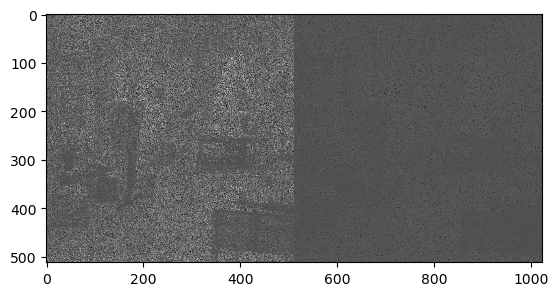

     Set12 :     03.png : 0.0151 second


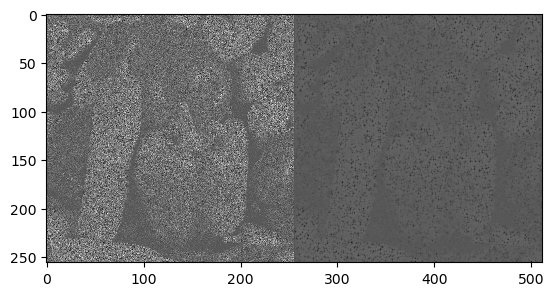

     Set12 :     04.png : 0.0150 second


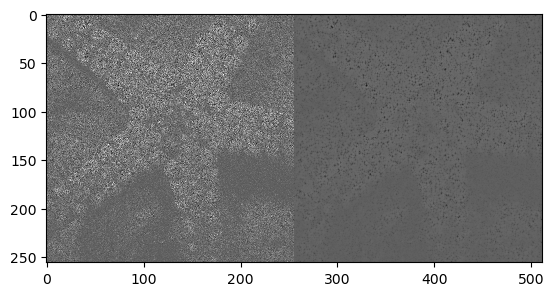

2024-12-13 03:26:27: Dataset: Set12      
  PSNR = 2.41dB, SSIM = 0.0292


In [5]:
def parse_args(args=None):
    parser = argparse.ArgumentParser()
    parser.add_argument('--set_dir', default='data/Test', type=str, help='directory of test dataset')
    parser.add_argument('--set_names', nargs='+', default=['Set68', 'Set12'], help='list of dataset names')
    parser.add_argument('--sigma', default=4, type=int, help='noise level')
    parser.add_argument('--model_dir', default='models/DnCNN_sigma4', type=str, help='directory of the model')
    parser.add_argument('--model_name', default='model_003.pth', type=str, help='the model name')
    parser.add_argument('--result_dir', default='results', type=str, help='directory for storing results')
    parser.add_argument('--save_result', default=False, action='store_true', help='save the denoised image, true or false')

    return parser.parse_args(args)
 
if __name__ == '__main__':
    args = parse_args(['--set_dir', 'data/Test', '--set_names', 'Set68', 'Set12', '--sigma', '4', '--model_dir', 'models/DnCNN_sigma4', '--model_name', 'model_003.pth', '--result_dir', 'results', '--save_result'])

    if not os.path.exists(os.path.join(args.model_dir, args.model_name)):

        model = torch.load(os.path.join(args.model_dir, 'model_003.pth'))
        # load weights into new model
        log('load trained model on Train400 dataset by kai')
    else:
        # model.load_state_dict(torch.load(os.path.join(args.model_dir, args.model_name)))
        model = torch.load(os.path.join(args.model_dir, args.model_name))
        log('load trained model')

#    params = model.state_dict()
#    print(params.values())
#    print(params.keys())
#
#    for key, value in params.items():
#        print(key)    # parameter name
#    print(params['dncnn.12.running_mean'])
#    print(model.state_dict())

    model.eval()  # evaluation mode
#    model.train()

    if torch.cuda.is_available():
        model = model.cuda()

    if not os.path.exists(args.result_dir):
        os.mkdir(args.result_dir)

    for set_cur in args.set_names:

        if not os.path.exists(os.path.join(args.result_dir, set_cur)):
            os.mkdir(os.path.join(args.result_dir, set_cur))
        psnrs = []
        ssims = []

        for im in os.listdir(os.path.join(args.set_dir, set_cur)):
            if im.endswith(".jpg") or im.endswith(".bmp") or im.endswith(".png"):

                x = np.array(imread(os.path.join(args.set_dir, set_cur, im)), dtype=np.float32)/255.0
                np.random.seed(seed=0)  # for reproducibility
                # Add Gaussian noise without clipping
                #y = x + np.random.normal(0, args.sigma/255.0, x.shape)
                # Add Poisson noise without clipping 
                #y = x + np.random.poisson(x * args.sigma) 
                # Add Speckle noise without clipping
                #y = x + np.random.randn(*x.shape) * args.sigma * x
                #Add Mixed noise without clipping
                mixed = np.random.poisson(x * args.sigma) + np.random.randn(*x.shape) * args.sigma * x
                y = x + mixed
                y = y.astype(np.float32)
                y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

                torch.cuda.synchronize()
                start_time = time.time()
                y_ = y_.cuda()
                x_ = model(y_)  # inference
                x_ = x_.view(y.shape[0], y.shape[1])
                x_ = x_.cpu()
                x_ = x_.detach().numpy().astype(np.float32)
                torch.cuda.synchronize()
                elapsed_time = time.time() - start_time
                print('%10s : %10s : %2.4f second' % (set_cur, im, elapsed_time))

                im_x = np.array(x, dtype=np.float32)
                im_x_ = np.array(x_, dtype=np.float32)
                data_range = im_x.max() - im_x.min()

                psnr_x_ = compare_psnr(x, x_)
                ssim_x_ = compare_ssim(im_x, im_x_, data_range=data_range)
                if args.save_result:
                    name, ext = os.path.splitext(im)
                    show(np.hstack((y, x_)))  # show the image
                    res = np.array(x_)
                    res_dn = np.clip(res, 0, 255).astype(np.uint8)
                    im_dn = Image.fromarray(res_dn)
                    save_result(im_dn, path=os.path.join(args.result_dir, set_cur, name+'_dncnn'+ext))  # save the denoised image
                psnrs.append(psnr_x_)
                ssims.append(ssim_x_)
        psnr_avg = np.mean(psnrs)
        ssim_avg = np.mean(ssims)
        psnrs.append(psnr_avg)
        ssims.append(ssim_avg)
        if args.save_result:
            save_result(np.hstack((psnrs, ssims)), path=os.path.join(args.result_dir, set_cur, 'results.txt'))
        log('Dataset: {0:10s} \n  PSNR = {1:2.2f}dB, SSIM = {2:1.4f}'.format(set_cur, psnr_avg, ssim_avg))